<a href="https://colab.research.google.com/github/AI-fanatic24/Breast-Cancer-Classification/blob/main/Prognostic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
breast_cancer_wisconsin_prognostic = fetch_ucirepo(id=16)

# data (as pandas dataframes)
X = breast_cancer_wisconsin_prognostic.data.features
y = breast_cancer_wisconsin_prognostic.data.targets

# metadata
print(breast_cancer_wisconsin_prognostic.metadata)

# variable information
print(breast_cancer_wisconsin_prognostic.variables)

{'uci_id': 16, 'name': 'Breast Cancer Wisconsin (Prognostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/16/breast+cancer+wisconsin+prognostic', 'data_url': 'https://archive.ics.uci.edu/static/public/16/data.csv', 'abstract': 'Prognostic Wisconsin Breast Cancer Database', 'area': 'Health and Medicine', 'tasks': ['Classification', 'Regression'], 'characteristics': ['Multivariate'], 'num_instances': 198, 'num_features': 33, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Outcome'], 'index_col': ['ID'], 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1995, 'last_updated': 'Sun Jan 14 2024', 'dataset_doi': '10.24432/C5GK50', 'creators': ['William Wolberg', 'W. Street', 'Olvi Mangasarian'], 'intro_paper': None, 'additional_info': {'summary': 'Each record represents follow-up data for one breast cancer case.  These are consecutive patients seen by Dr. Wolberg since 1984, and include only those cases exhibiting invasive brea

In [ ]:
X

,Time,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,...,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size,lymph_node_status
0,31,18.02,27.60,117.50,1013.0,0.09489,0.10360,0.10860,0.07055,0.1865,...,139.70,1436.0,0.11950,0.1926,0.3140,0.11700,0.2677,0.08113,5.0,5.0
1,61,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,184.60,2019.0,0.16220,0.6656,0.7119,0.26540,0.4601,0.11890,3.0,2.0
2,116,21.37,17.44,137.50,1373.0,0.08836,0.11890,0.12550,0.08180,0.2333,...,159.10,1949.0,0.11880,0.3449,0.3414,0.20320,0.4334,0.09067,2.5,0.0
3,123,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,98.87,567.7,0.20980,0.8663,0.6869,0.25750,0.6638,0.17300,2.0,0.0
4,27,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,152.20,1575.0,0.13740,0.2050,0.4000,0.16250,0.2364,0.07678,3.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,10,22.52,21.92,146.90,1597.0,0.07592,0.09162,0.06862,0.06367,0.1728,...,162.10,1902.0,0.08191,0.1319,0.1056,0.09378,0.2061,0.05788,6.0,2.0
194,8,15.44,31.18,101.00,740.4,0.09399,0.10620,0.13750,0.06500,0.1735,...,112.60,929.0,0.12720,0.2362,0.2975,0.12860,0.2914,0.08024,1.5,0.0
195,12,17.17,29.19,110.00,915.3,0.08952,0.06655,0.06583,0.05068,0.1793,...,132.50,1295.0,0.12610,0.1572,0.2141,0.09520,0.3362,0.06033,3.7,0.0
196,3,21.42,22.84,145.00,1440.0,0.10700,0.19390,0.23800,0.13180,0.1884,...,198.30,2375.0,0.14980,0.4379,0.5411,0.22150,0.2832,0.08981,3.0,NaN


In [ ]:
y

,Outcome
0,N
1,N
2,N
3,N
4,R
...,...
193,N
194,N
195,N
196,R


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [ ]:
df = pd.concat([X,y],axis=1)
df

,Time,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,...,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size,lymph_node_status,Outcome
0,31,18.02,27.60,117.50,1013.0,0.09489,0.10360,0.10860,0.07055,0.1865,...,1436.0,0.11950,0.1926,0.3140,0.11700,0.2677,0.08113,5.0,5.0,N
1,61,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,2019.0,0.16220,0.6656,0.7119,0.26540,0.4601,0.11890,3.0,2.0,N
2,116,21.37,17.44,137.50,1373.0,0.08836,0.11890,0.12550,0.08180,0.2333,...,1949.0,0.11880,0.3449,0.3414,0.20320,0.4334,0.09067,2.5,0.0,N
3,123,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,567.7,0.20980,0.8663,0.6869,0.25750,0.6638,0.17300,2.0,0.0,N
4,27,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,1575.0,0.13740,0.2050,0.4000,0.16250,0.2364,0.07678,3.5,0.0,R
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,10,22.52,21.92,146.90,1597.0,0.07592,0.09162,0.06862,0.06367,0.1728,...,1902.0,0.08191,0.1319,0.1056,0.09378,0.2061,0.05788,6.0,2.0,N
194,8,15.44,31.18,101.00,740.4,0.09399,0.10620,0.13750,0.06500,0.1735,...,929.0,0.12720,0.2362,0.2975,0.12860,0.2914,0.08024,1.5,0.0,N
195,12,17.17,29.19,110.00,915.3,0.08952,0.06655,0.06583,0.05068,0.1793,...,1295.0,0.12610,0.1572,0.2141,0.09520,0.3362,0.06033,3.7,0.0,N
196,3,21.42,22.84,145.00,1440.0,0.10700,0.19390,0.23800,0.13180,0.1884,...,2375.0,0.14980,0.4379,0.5411,0.22150,0.2832,0.08981,3.0,NaN,R


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198 entries, 0 to 197
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Time                198 non-null    int64  
 1   radius1             198 non-null    float64
 2   texture1            198 non-null    float64
 3   perimeter1          198 non-null    float64
 4   area1               198 non-null    float64
 5   smoothness1         198 non-null    float64
 6   compactness1        198 non-null    float64
 7   concavity1          198 non-null    float64
 8   concave_points1     198 non-null    float64
 9   symmetry1           198 non-null    float64
 10  fractal_dimension1  198 non-null    float64
 11  radius2             198 non-null    float64
 12  texture2            198 non-null    float64
 13  perimeter2          198 non-null    float64
 14  area2               198 non-null    float64
 15  smoothness2         198 non-null    float64
 16  compactn

In [ ]:
df.describe()

,Time,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,...,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size,lymph_node_status
count,198.000000,198.000000,198.00000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,...,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,194.000000
mean,46.732323,17.412323,22.27601,114.856566,970.040909,0.102681,0.142648,0.156243,0.086776,0.192754,...,140.347778,1404.958586,0.143921,0.365102,0.436685,0.178778,0.323404,0.090828,2.847475,3.211340
std,34.462870,3.161676,4.29829,21.383402,352.149215,0.012522,0.049898,0.070572,0.033877,0.027437,...,28.892279,586.006972,0.022004,0.163965,0.173625,0.045181,0.075161,0.021172,1.937964,5.479276
min,1.000000,10.950000,10.38000,71.900000,361.600000,0.074970,0.046050,0.023980,0.020310,0.130800,...,85.100000,508.100000,0.081910,0.051310,0.023980,0.028990,0.156500,0.055040,0.400000,0.000000
25%,14.000000,15.052500,19.41250,98.160000,702.525000,0.093900,0.110200,0.106850,0.063670,0.174075,...,118.075000,947.275000,0.129325,0.248700,0.322150,0.152650,0.275950,0.076577,1.500000,0.000000
50%,39.500000,17.290000,21.75000,113.700000,929.100000,0.101900,0.131750,0.151350,0.086075,0.189350,...,136.500000,1295.000000,0.141850,0.351300,0.402350,0.179250,0.310300,0.086890,2.500000,1.000000
75%,72.750000,19.580000,24.65500,129.650000,1193.500000,0.110975,0.172200,0.200500,0.103925,0.209325,...,159.875000,1694.250000,0.154875,0.423675,0.541050,0.207125,0.358800,0.101375,3.500000,4.000000
max,125.000000,27.220000,39.28000,182.100000,2250.000000,0.144700,0.311400,0.426800,0.201200,0.304000,...,232.200000,3903.000000,0.222600,1.058000,1.170000,0.290300,0.663800,0.207500,10.000000,27.000000


In [ ]:
df.drop(columns=['Time'],inplace=True)
df

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size,lymph_node_status,Outcome
0,18.02,27.60,117.50,1013.0,0.09489,0.10360,0.10860,0.07055,0.1865,0.06333,...,1436.0,0.11950,0.1926,0.3140,0.11700,0.2677,0.08113,5.0,5.0,N
1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,2019.0,0.16220,0.6656,0.7119,0.26540,0.4601,0.11890,3.0,2.0,N
2,21.37,17.44,137.50,1373.0,0.08836,0.11890,0.12550,0.08180,0.2333,0.06010,...,1949.0,0.11880,0.3449,0.3414,0.20320,0.4334,0.09067,2.5,0.0,N
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,567.7,0.20980,0.8663,0.6869,0.25750,0.6638,0.17300,2.0,0.0,N
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,1575.0,0.13740,0.2050,0.4000,0.16250,0.2364,0.07678,3.5,0.0,R
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,22.52,21.92,146.90,1597.0,0.07592,0.09162,0.06862,0.06367,0.1728,0.05262,...,1902.0,0.08191,0.1319,0.1056,0.09378,0.2061,0.05788,6.0,2.0,N
194,15.44,31.18,101.00,740.4,0.09399,0.10620,0.13750,0.06500,0.1735,0.06105,...,929.0,0.12720,0.2362,0.2975,0.12860,0.2914,0.08024,1.5,0.0,N
195,17.17,29.19,110.00,915.3,0.08952,0.06655,0.06583,0.05068,0.1793,0.05392,...,1295.0,0.12610,0.1572,0.2141,0.09520,0.3362,0.06033,3.7,0.0,N
196,21.42,22.84,145.00,1440.0,0.10700,0.19390,0.23800,0.13180,0.1884,0.06472,...,2375.0,0.14980,0.4379,0.5411,0.22150,0.2832,0.08981,3.0,NaN,R


**CHECKING NULL VALUES**

In [ ]:
print(df.isnull().sum())

radius1               0
texture1              0
perimeter1            0
area1                 0
smoothness1           0
compactness1          0
concavity1            0
concave_points1       0
symmetry1             0
fractal_dimension1    0
radius2               0
texture2              0
perimeter2            0
area2                 0
smoothness2           0
compactness2          0
concavity2            0
concave_points2       0
symmetry2             0
fractal_dimension2    0
radius3               0
texture3              0
perimeter3            0
area3                 0
smoothness3           0
compactness3          0
concavity3            0
concave_points3       0
symmetry3             0
fractal_dimension3    0
tumor_size            0
lymph_node_status     4
Outcome               0
dtype: int64


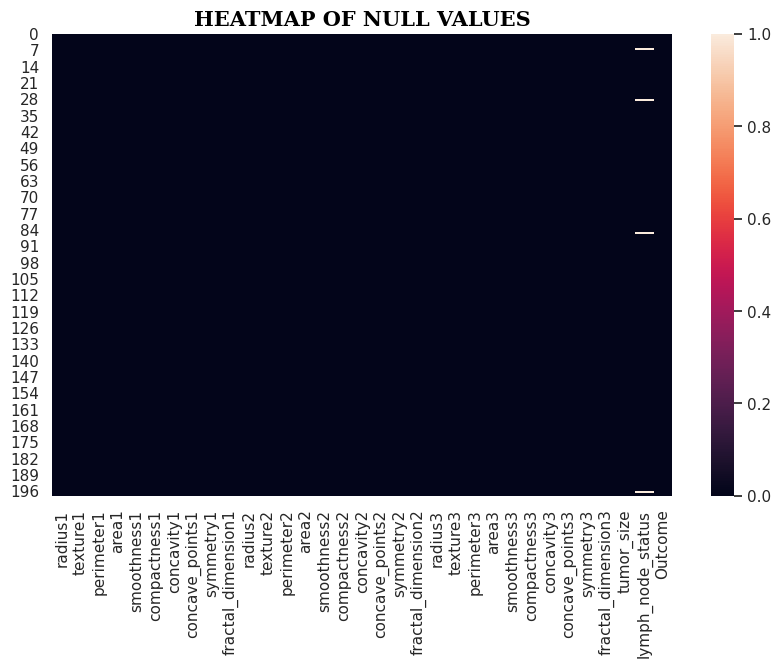

In [ ]:
sns.set(rc={'figure.figsize':(10,6)})
sns.heatmap(df.isnull())
plt.title("HEATMAP OF NULL VALUES",fontdict={'family':'serif','fontsize':15,'color':'black','fontweight':'bold'})
plt.show()

In [ ]:
null_var=df.isnull().sum()/df.shape[0] *100
print("----Percentage of null values in each column----")
print(null_var)

----Percentage of null values in each column----
radius1               0.000000
texture1              0.000000
perimeter1            0.000000
area1                 0.000000
smoothness1           0.000000
compactness1          0.000000
concavity1            0.000000
concave_points1       0.000000
symmetry1             0.000000
fractal_dimension1    0.000000
radius2               0.000000
texture2              0.000000
perimeter2            0.000000
area2                 0.000000
smoothness2           0.000000
compactness2          0.000000
concavity2            0.000000
concave_points2       0.000000
symmetry2             0.000000
fractal_dimension2    0.000000
radius3               0.000000
texture3              0.000000
perimeter3            0.000000
area3                 0.000000
smoothness3           0.000000
compactness3          0.000000
concavity3            0.000000
concave_points3       0.000000
symmetry3             0.000000
fractal_dimension3    0.000000
tumor_size           

In [ ]:
fontdict={'family':'serif','fontsize':12,'color':'black','fontweight':'bold'}

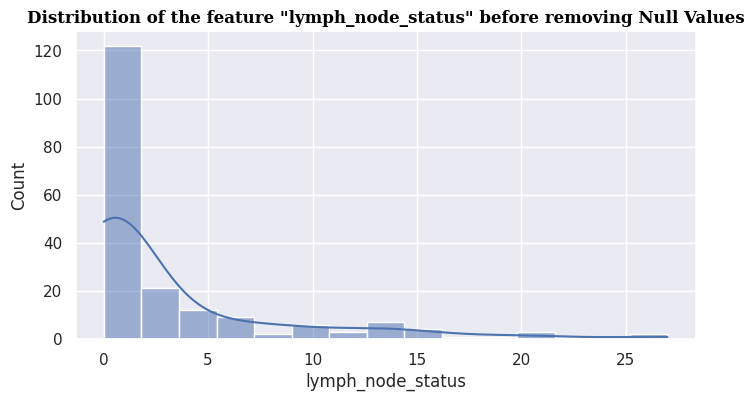

In [ ]:
sns.set(rc={'figure.figsize':(8,4)})
sns.histplot(df,x='lymph_node_status',kde=True,bins=15)
plt.title('Distribution of the feature "lymph_node_status" before removing Null Values',fontdict=fontdict)
plt.show()

**HANDLING NULL VALUES**

In [ ]:
median = df['lymph_node_status'].median()
median

1.0

In [ ]:
df['lymph_node_status'].fillna(median, inplace=True)

/tmp/ipython-input-16-3824418516.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['lymph_node_status'].fillna(median, inplace=True)


In [ ]:
df.isnull().sum()

,0
radius1,0
texture1,0
perimeter1,0
area1,0
smoothness1,0
compactness1,0
concavity1,0
concave_points1,0
symmetry1,0
fractal_dimension1,0


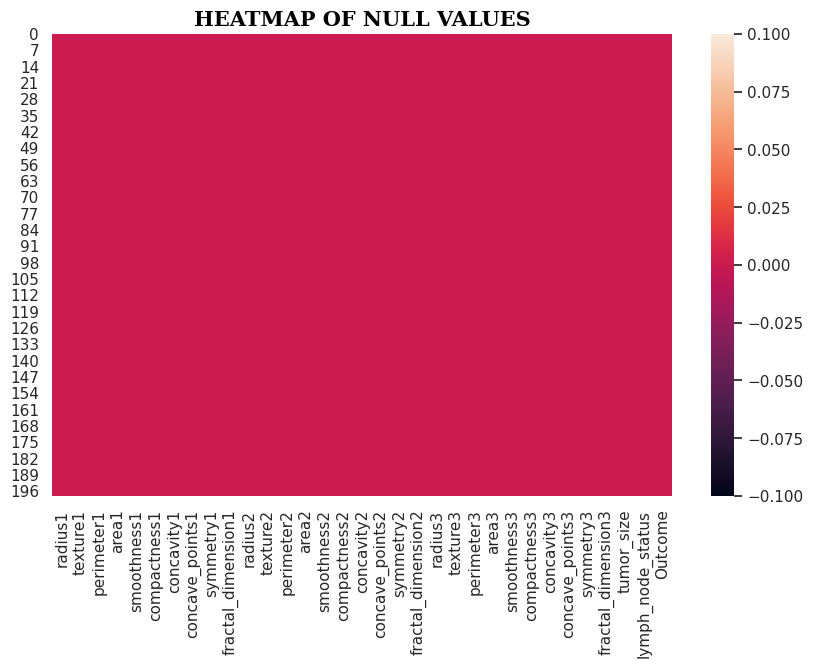

In [ ]:
sns.set(rc={'figure.figsize':(10,6)})
sns.heatmap(df.isnull())
plt.title("HEATMAP OF NULL VALUES",fontdict={'family':'serif','fontsize':15,'color':'black','fontweight':'bold'})
plt.show()

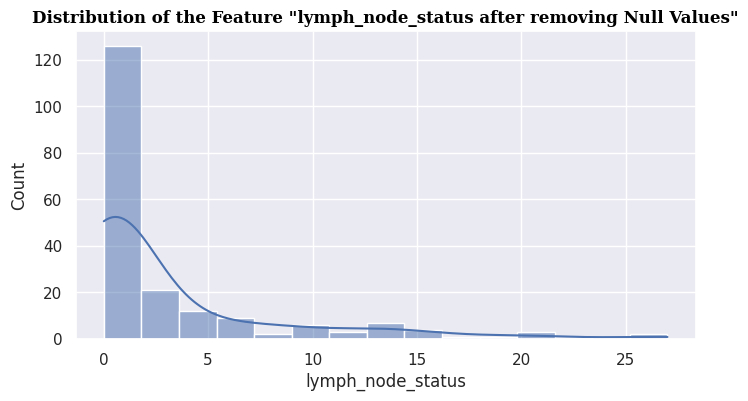

In [ ]:
sns.set(rc={'figure.figsize':(8,4)})
sns.histplot(df,x='lymph_node_status',kde=True,bins=15)
plt.title('Distribution of the Feature "lymph_node_status after removing Null Values"',fontdict=fontdict)
plt.show()

In [ ]:
df['lymph_node_status'].median()

1.0

**VISUALIZING OUTLIERS**

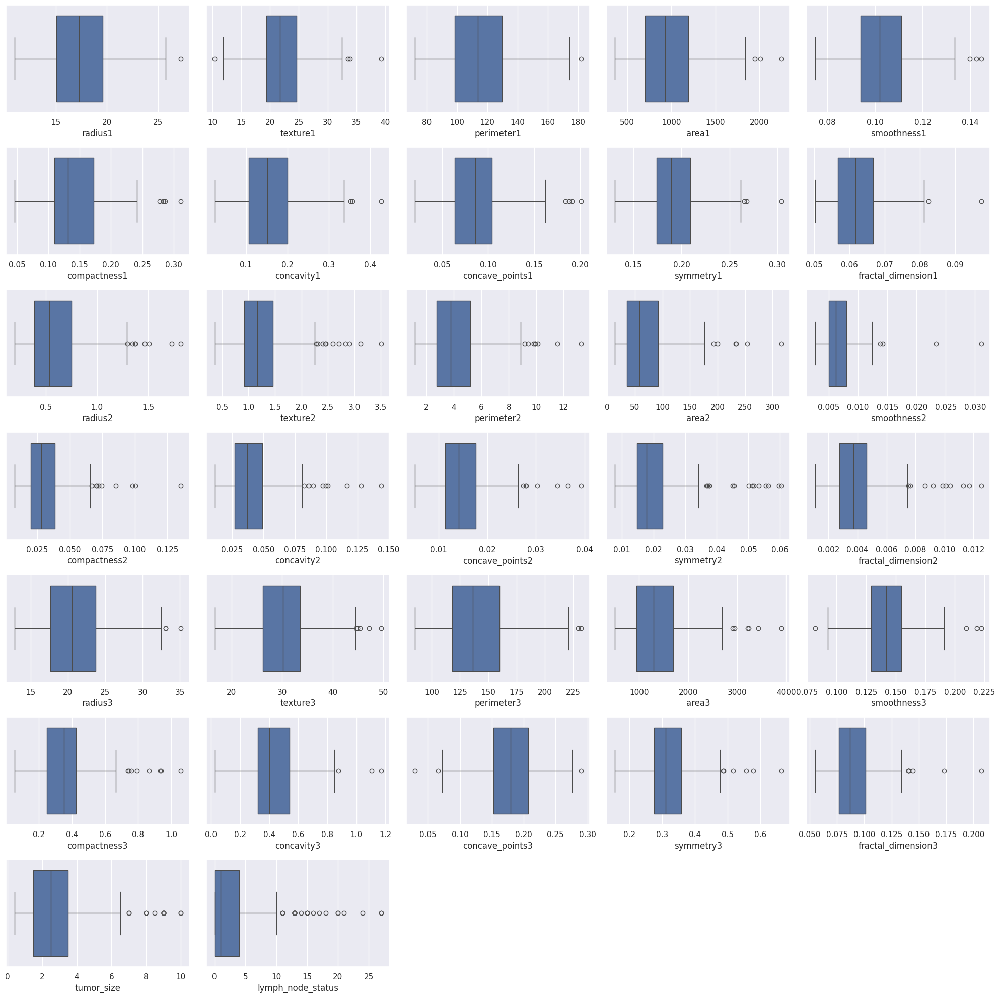

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
for i in range(len(df.columns[:-1])):
  plt.subplot(7,5,(i+1))
  sns.boxplot(x=df.iloc[:,i])

plt.tight_layout()

plt.show()

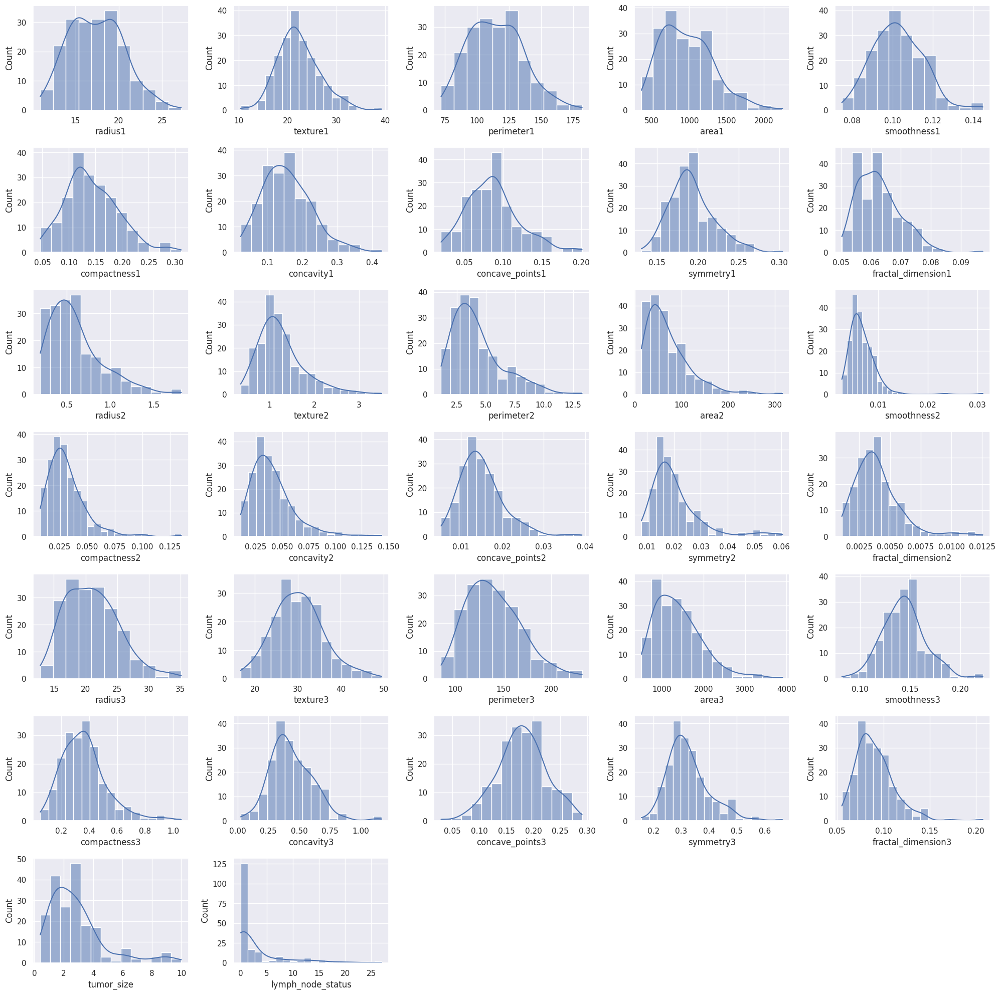

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
for i in range(len(df.columns[:-1])):
  plt.subplot(7,5,(i+1))
  sns.histplot(x=df.iloc[:,i],kde=True)

plt.tight_layout()

plt.show()

In [ ]:
columns = df.columns
print("----MEDIAN OF FEATURES----")
for i in range(len(df.columns[:-1])):
  print(columns[i],":",df.iloc[:,i].median())

----MEDIAN OF FEATURES----
radius1 : 17.29
texture1 : 21.75
perimeter1 : 113.7
area1 : 929.0999999999999
smoothness1 : 0.10189999999999999
compactness1 : 0.13175
concavity1 : 0.15134999999999998
concave_points1 : 0.086075
symmetry1 : 0.18935000000000002
fractal_dimension1 : 0.061715
radius2 : 0.53325
texture2 : 1.1684999999999999
perimeter2 : 3.767
area2 : 58.455
smoothness2 : 0.006193000000000001
compactness2 : 0.027880000000000002
concavity2 : 0.03691
concave_points2 : 0.014175
symmetry2 : 0.017904999999999997
fractal_dimension2 : 0.003719
radius3 : 20.525
texture3 : 30.134999999999998
perimeter3 : 136.5
area3 : 1295.0
smoothness3 : 0.14185
compactness3 : 0.3513
concavity3 : 0.40235
concave_points3 : 0.17925
symmetry3 : 0.3103
fractal_dimension3 : 0.08689
tumor_size : 2.5
lymph_node_status : 1.0


In [ ]:
df.columns

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3', 'tumor_size', 'lymph_node_status',
       'Outcome'],
      dtype='object')

**VISUALIZING PROGNOSIS PATTERNS IN THE DATA**

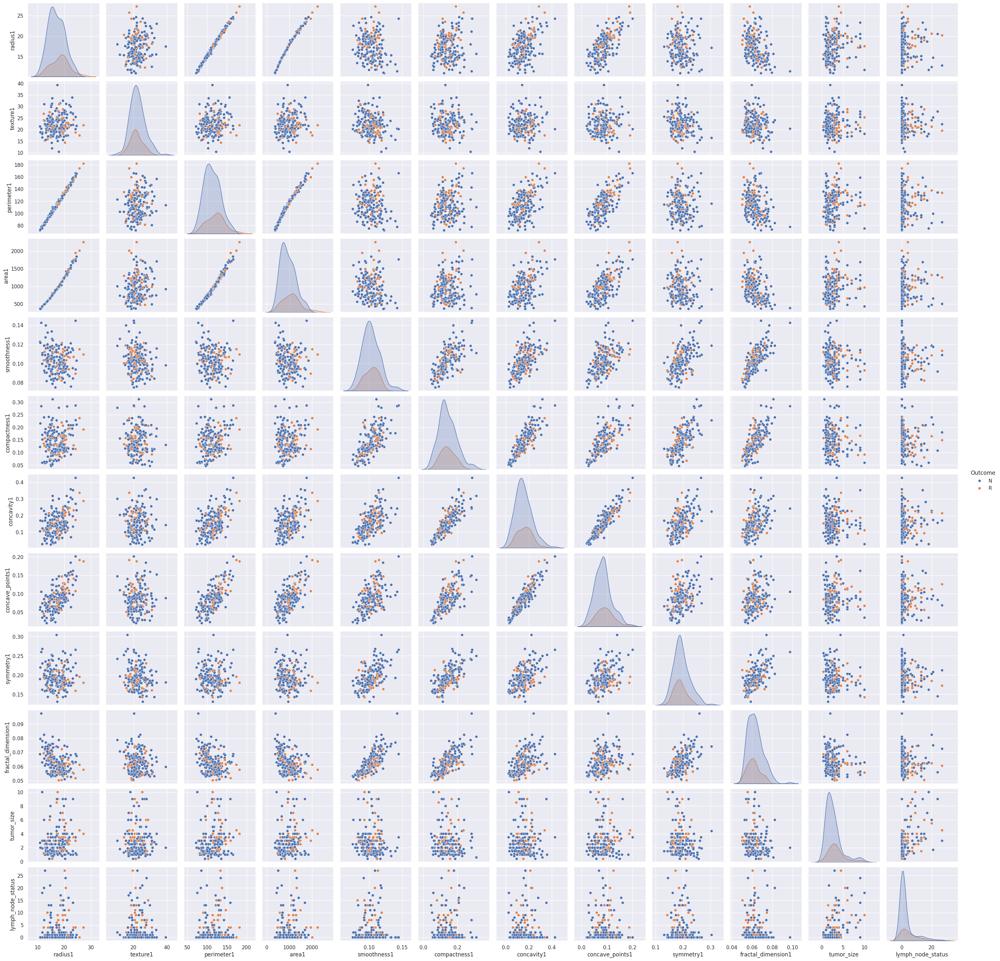

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
sns.pairplot(df[['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1','tumor_size', 'lymph_node_status','Outcome']],hue='Outcome')
plt.show()

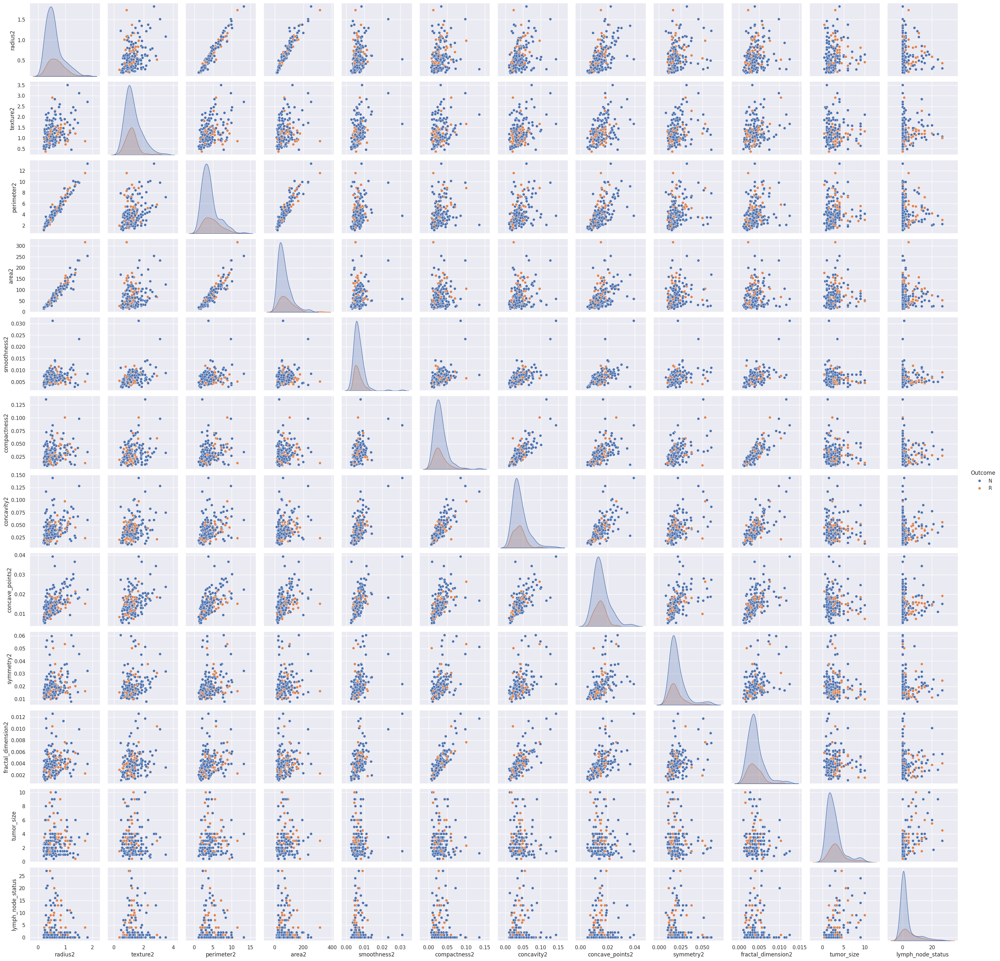

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
sns.pairplot(df[['radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2','tumor_size', 'lymph_node_status','Outcome']],hue='Outcome')
plt.show()

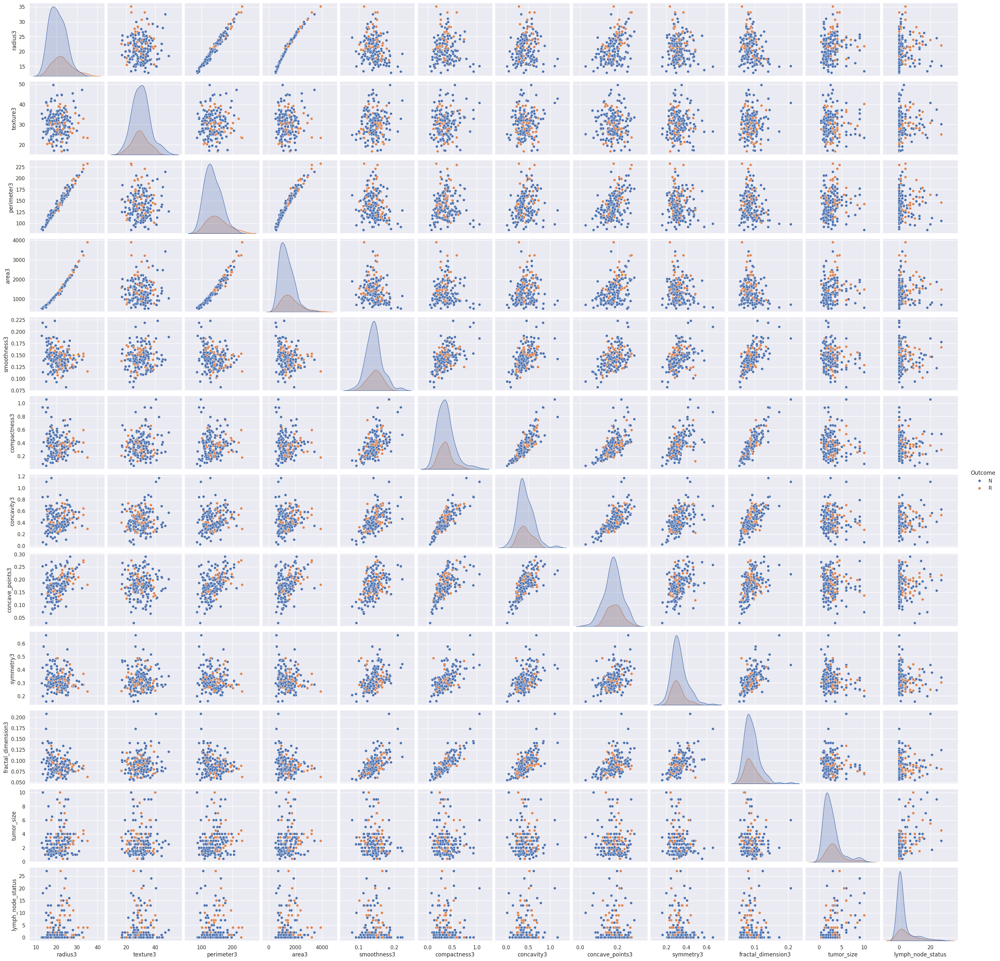

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
sns.pairplot(df[['radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3','tumor_size', 'lymph_node_status','Outcome']],hue='Outcome')
plt.show()

In [ ]:
fontdict = {'family':'serif','fontsize':12,'fontweight':'bold'}

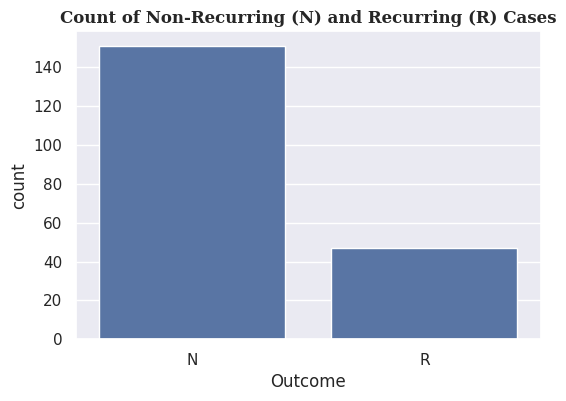

,count
Outcome,
N,151
R,47


In [ ]:
sns.set(rc={'figure.figsize':(6,4)})
plt.title("Count of Non-Recurring (N) and Recurring (R) Cases",fontdict=fontdict)
sns.countplot(df,x='Outcome')
plt.show()
df.Outcome.value_counts()

**LABEL ENCODING THE TARGET VARIABLE**

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
le = LabelEncoder()
df['Outcome'] = le.fit_transform(df['Outcome'])
df

# 0 = Non-Recurring (N)
# 1 = Recurring (R)

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,tumor_size,lymph_node_status,Outcome
0,18.02,27.60,117.50,1013.0,0.09489,0.10360,0.10860,0.07055,0.1865,0.06333,...,1436.0,0.11950,0.1926,0.3140,0.11700,0.2677,0.08113,5.0,5.0,0
1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,2019.0,0.16220,0.6656,0.7119,0.26540,0.4601,0.11890,3.0,2.0,0
2,21.37,17.44,137.50,1373.0,0.08836,0.11890,0.12550,0.08180,0.2333,0.06010,...,1949.0,0.11880,0.3449,0.3414,0.20320,0.4334,0.09067,2.5,0.0,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,567.7,0.20980,0.8663,0.6869,0.25750,0.6638,0.17300,2.0,0.0,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,1575.0,0.13740,0.2050,0.4000,0.16250,0.2364,0.07678,3.5,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,22.52,21.92,146.90,1597.0,0.07592,0.09162,0.06862,0.06367,0.1728,0.05262,...,1902.0,0.08191,0.1319,0.1056,0.09378,0.2061,0.05788,6.0,2.0,0
194,15.44,31.18,101.00,740.4,0.09399,0.10620,0.13750,0.06500,0.1735,0.06105,...,929.0,0.12720,0.2362,0.2975,0.12860,0.2914,0.08024,1.5,0.0,0
195,17.17,29.19,110.00,915.3,0.08952,0.06655,0.06583,0.05068,0.1793,0.05392,...,1295.0,0.12610,0.1572,0.2141,0.09520,0.3362,0.06033,3.7,0.0,0
196,21.42,22.84,145.00,1440.0,0.10700,0.19390,0.23800,0.13180,0.1884,0.06472,...,2375.0,0.14980,0.4379,0.5411,0.22150,0.2832,0.08981,3.0,1.0,1


In [ ]:
df.to_csv('breast_cancer_prognostic_preprocessed.csv',index=False)

**VISUALIZING CORRELATION MATRIX**

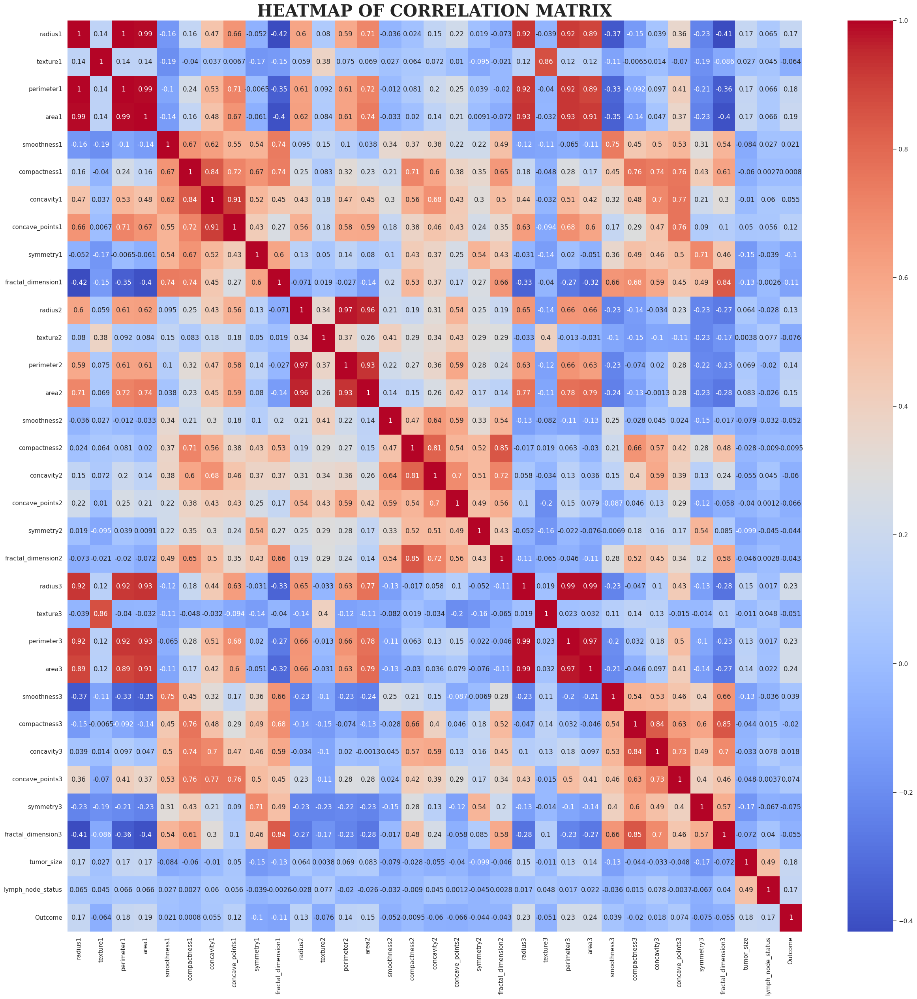

In [ ]:
sns.set(rc={'figure.figsize':(30,30)})
sns.heatmap(df.corr(),annot=True,cmap='coolwarm')
plt.title("HEATMAP OF CORRELATION MATRIX",fontdict={'family':'serif','fontsize':30,'fontweight':'bold'})
plt.show()

**SPLITTING THE DATA INTO TRAIN SET AND TEST SET**

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
df.columns

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3', 'tumor_size', 'lymph_node_status',
       'Outcome'],
      dtype='object')

In [ ]:
df = df[['radius1', 'texture1', 'perimeter1', 'area1','concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1','tumor_size', 'lymph_node_status',
       'Outcome']]

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(df.iloc[:,:-1],df.iloc[:,-1],test_size=0.30,random_state=42)

In [ ]:
print("X_train:",X_train.shape)
print("X_test:",X_test.shape)
print("y_train:",y_train.shape)
print("y_test:",y_test.shape)

X_train: (138, 10)
X_test: (60, 10)
y_train: (138,)
y_test: (60,)


In [ ]:
train_data = pd.concat([X_train,y_train],axis=1)
train_data

,radius1,texture1,perimeter1,area1,concavity1,concave_points1,symmetry1,fractal_dimension1,tumor_size,lymph_node_status,Outcome
51,14.42,19.77,94.48,642.5,0.09388,0.05839,0.1879,0.06390,0.4,1.0,0
168,15.22,30.62,103.40,716.9,0.25500,0.09429,0.2128,0.07152,2.5,0.0,0
38,13.17,18.66,85.98,534.6,0.12260,0.07340,0.2128,0.06777,1.0,1.0,0
31,13.48,20.82,88.40,559.2,0.10630,0.05439,0.1720,0.06419,2.5,0.0,0
97,17.05,19.08,113.40,895.0,0.19100,0.10900,0.2131,0.06325,1.5,5.0,0
...,...,...,...,...,...,...,...,...,...,...,...
106,15.32,17.27,103.20,713.3,0.24480,0.12420,0.2398,0.07596,0.8,0.0,0
14,14.68,20.13,94.74,684.5,0.07395,0.05259,0.1586,0.05922,1.1,0.0,0
92,13.86,16.93,90.96,578.9,0.09901,0.05602,0.2106,0.06916,4.0,2.0,0
179,15.60,26.79,99.85,760.0,0.03778,0.02876,0.1580,0.05395,2.0,2.0,0


**CHECKING IMBALANCE IN TRAINING DATA**

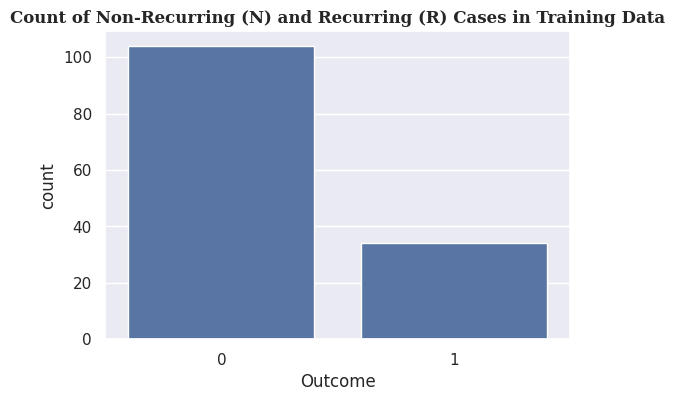

,count
Outcome,
0,104
1,34


In [ ]:
sns.set(rc={'figure.figsize':(6,4)})
sns.countplot(train_data,x='Outcome')
plt.title("Count of Non-Recurring (N) and Recurring (R) Cases in Training Data",fontdict=fontdict)
plt.show()
train_data['Outcome'].value_counts()

**HANDLING IMBALANCE IN TRAINING DATA**

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
np.random.seed(123)
smote = SMOTE()
X_train,y_train = smote.fit_resample(X_train,y_train)

In [ ]:
print("X_train",X_train.shape)
print("y_train",y_train.shape)

X_train (208, 10)
y_train (208,)


In [ ]:
y_train_df = pd.DataFrame(y_train)
y_train_df

,Outcome
0,0
1,0
2,0
3,0
4,0
...,...
203,1
204,1
205,1
206,1


In [ ]:
y_train_df.to_csv('y_train.csv',index=False)

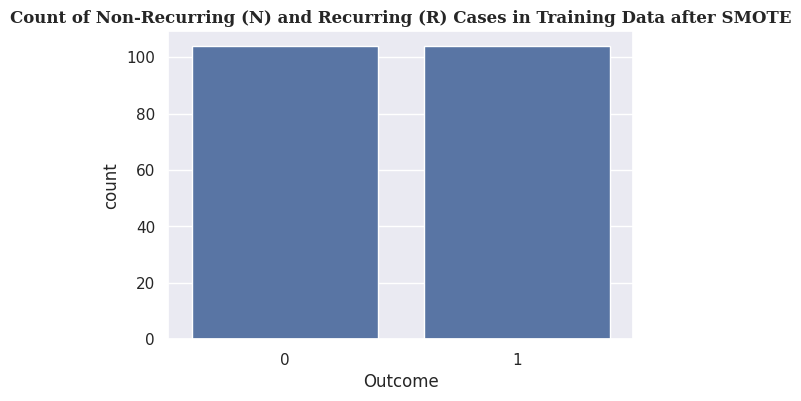

In [ ]:
sns.countplot(y_train_df,x='Outcome')
plt.title("Count of Non-Recurring (N) and Recurring (R) Cases in Training Data after SMOTE",fontdict=fontdict)
plt.show()

**NORMALIZING THE DATA**

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_train_scaled

In [ ]:
X_train_df = pd.DataFrame(X_train_scaled)
X_train_df

In [ ]:
X_train_df.to_csv('X_train.csv',index=False)

In [ ]:
X_test_scaled

In [ ]:
X_test_df = pd.DataFrame(X_test_scaled)
X_test_df

In [ ]:
X_test_df.to_csv('X_test.csv',index=False)

In [ ]:
y_test_df = pd.DataFrame(y_test)
y_test_df

,Outcome
65,0
114,1
16,0
141,0
156,0
126,0
140,0
30,0
18,0
167,0


In [ ]:
y_test_df.to_csv('y_test.csv',index=False)

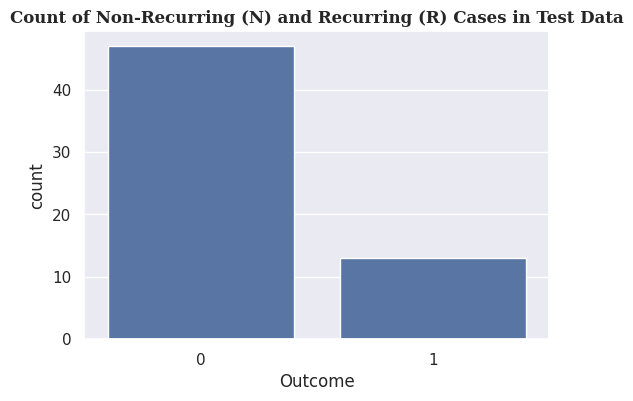

,count
Outcome,
0,47
1,13


In [ ]:
sns.countplot(y_test_df,x='Outcome')
plt.title("Count of Non-Recurring (N) and Recurring (R) Cases in Test Data",fontdict=fontdict)
plt.show()
y_test_df['Outcome'].value_counts()

**LOGISTIC REGRESSION**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

In [ ]:
model = LogisticRegression(random_state=1)
model.fit(X_train_scaled,y_train)

LogisticRegression(random_state=1)

In [ ]:
prediction = model.predict(X_train_scaled)
prediction

array([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 0])

In [ ]:
print(accuracy_score(y_train,prediction))

0.7259615384615384


In [ ]:
print(confusion_matrix(y_train,prediction))

[[82 22]
 [35 69]]


In [ ]:
print(classification_report(y_train,prediction))

              precision    recall  f1-score   support

           0       0.70      0.79      0.74       104
           1       0.76      0.66      0.71       104

    accuracy                           0.73       208
   macro avg       0.73      0.73      0.72       208
weighted avg       0.73      0.73      0.72       208



In [ ]:
prediction = model.predict(X_test_scaled)
prediction

array([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0])

In [ ]:
print(accuracy_score(y_test,prediction))

0.6166666666666667


In [ ]:
print(confusion_matrix(y_test,prediction))

[[30 17]
 [ 6  7]]


In [ ]:
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

           0       0.83      0.64      0.72        47
           1       0.29      0.54      0.38        13

    accuracy                           0.62        60
   macro avg       0.56      0.59      0.55        60
weighted avg       0.72      0.62      0.65        60



In [ ]:
param_grid = {'penalty':['l1', 'l2', 'elasticnet',None],'C':[0.1,0.2,0.4,0.5,1,10,20,40,50],'solver':['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']}

In [ ]:
cv = StratifiedKFold(shuffle=True)

In [ ]:
grid = GridSearchCV(estimator=model,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_params_

{'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}

In [ ]:
grid.best_score_

np.float64(0.6627177700348433)

In [ ]:
best_model = grid.best_estimator_
best_model

LogisticRegression(C=0.1, penalty='l1', random_state=1, solver='liblinear')

In [ ]:
prediction = best_model.predict(X_train_scaled)
prediction

array([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 1])

In [ ]:
print("Training Accuracy")
print(accuracy_score(y_train,prediction))

Training Accuracy
0.7067307692307693


In [ ]:
print("Training Confusion Matrix")
print(confusion_matrix(y_train,prediction))

Training Confusion Matrix
[[79 25]
 [27 77]]


In [ ]:
print("Training Classification Report")
print(classification_report(y_train,prediction))

Training Classification Report
              precision    recall  f1-score   support

           0       0.66      0.86      0.74       104
           1       0.79      0.56      0.66       104

    accuracy                           0.71       208
   macro avg       0.73      0.71      0.70       208
weighted avg       0.73      0.71      0.70       208



In [ ]:
prediction = best_model.predict(X_test_scaled)
prediction

array([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0])

In [ ]:
print("Testing Accuracy")
print(accuracy_score(y_test,prediction))

Testing Accuracy
0.6666666666666666


In [ ]:
print("Testing Confusion Matrix")
print(confusion_matrix(y_test,prediction))

Testing Confusion Matrix
[[33 14]
 [ 6  7]]


In [ ]:
print("Testing Classification Report")
print(classification_report(y_test,prediction))

Testing Classification Report
              precision    recall  f1-score   support

           0       0.85      0.70      0.77        47
           1       0.33      0.54      0.41        13

    accuracy                           0.67        60
   macro avg       0.59      0.62      0.59        60
weighted avg       0.74      0.67      0.69        60



In [ ]:
import joblib

In [ ]:
joblib.dump(best_model,'logistic_regression_model.joblib')

['logistic_regression_model.joblib']

In [ ]:
loaded_logistic = joblib.load('logistic_regression_model.joblib')

**RANDOM FOREST**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
classifier = RandomForestClassifier(random_state=3)
classifier.fit(X_train_scaled, y_train)

RandomForestClassifier(random_state=3)

In [ ]:
prediction = classifier.predict(X_train_scaled)
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
acc=accuracy_score(y_train,prediction)
print(acc*100)

100.0


In [ ]:
c=confusion_matrix(y_train,prediction)
print(c)

[[104   0]
 [  0 104]]


In [ ]:
print(classification_report(y_train,prediction))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       104
           1       1.00      1.00      1.00       104

    accuracy                           1.00       208
   macro avg       1.00      1.00      1.00       208
weighted avg       1.00      1.00      1.00       208



In [ ]:
prediction=classifier.predict(X_test_scaled)
prediction

array([0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0])

In [ ]:
acc=accuracy_score(y_test,prediction)
print(acc*100)

63.33333333333333


In [ ]:
c=confusion_matrix(y_test,prediction)
print(c)

[[33 14]
 [ 8  5]]


In [ ]:
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

           0       0.80      0.70      0.75        47
           1       0.26      0.38      0.31        13

    accuracy                           0.63        60
   macro avg       0.53      0.54      0.53        60
weighted avg       0.69      0.63      0.66        60



In [ ]:
param_grid = {'n_estimators':[20,30,40],'criterion':['gini', 'entropy', 'log_loss'],'max_depth':[2,3],'min_samples_split':[2,3,4,8],'min_samples_leaf':[2,3,4],'max_features':['sqrt', 'log2', None]}

In [ ]:
cv=StratifiedKFold(shuffle=True)

In [ ]:
grid=GridSearchCV(estimator=classifier,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_params_

{'criterion': 'gini',
 'max_depth': 2,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 40}

In [ ]:
grid.best_score_

np.float64(0.759349593495935)

In [ ]:
best_model = grid.best_estimator_
best_model

RandomForestClassifier(max_depth=2, min_samples_leaf=2, n_estimators=40,
                       random_state=3)

In [ ]:
print("Training Accuracy")
prediction = best_model.predict(X_train_scaled)
print(accuracy_score(y_train,prediction))

Training Accuracy
0.8221153846153846


In [ ]:
print("Training Confusion Matrix")
print(confusion_matrix(y_train,prediction))

Training Confusion Matrix
[[85 19]
 [18 86]]


In [ ]:
print("Training Classification Report")
print(classification_report(y_train,prediction))

Training Classification Report
              precision    recall  f1-score   support

           0       0.83      0.82      0.82       104
           1       0.82      0.83      0.82       104

    accuracy                           0.82       208
   macro avg       0.82      0.82      0.82       208
weighted avg       0.82      0.82      0.82       208



In [ ]:
print("Testing Accuracy")
prediction = best_model.predict(X_test_scaled)
print(accuracy_score(y_test,prediction))

Testing Accuracy
0.5833333333333334


In [ ]:
print("Testing Confusion Matrix")
print(confusion_matrix(y_test,prediction))

Testing Confusion Matrix
[[27 20]
 [ 5  8]]


In [ ]:
print("Testing Classification Report")
print(classification_report(y_test,prediction))

Testing Classification Report
              precision    recall  f1-score   support

           0       0.84      0.57      0.68        47
           1       0.29      0.62      0.39        13

    accuracy                           0.58        60
   macro avg       0.56      0.59      0.54        60
weighted avg       0.72      0.58      0.62        60



In [ ]:
joblib.dump(best_model,'random_forest_model.joblib')

['random_forest_model.joblib']

In [ ]:
loaded_random_forest = joblib.load('random_forest_model.joblib')

**XGBOOST**

In [ ]:
from xgboost import XGBClassifier

In [ ]:
xgb_model=XGBClassifier(random_state=33)
xgb_model.fit(X_train_scaled,y_train,verbose=2)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=33, ...)

In [ ]:
prediction=xgb_model.predict(X_train_scaled)
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
acc=accuracy_score(y_train,prediction)
print(acc*100)

100.0


In [ ]:
c=confusion_matrix(y_train,prediction)
print(c)

[[104   0]
 [  0 104]]


In [ ]:
prediction=xgb_model.predict(X_test_scaled)
prediction

array([0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1])

In [ ]:
acc=accuracy_score(y_test,prediction)
print(acc*100)

68.33333333333333


In [ ]:
c=confusion_matrix(y_test,prediction)
print(c)

[[35 12]
 [ 7  6]]


In [ ]:
cv = StratifiedKFold(shuffle=True)

In [ ]:
param_grid = {'learning_rate':[0.1,0.2,0.3,0.4],'gamma':[0,1,4],'max_depth':[2,4,6],'min_child_weight':[2,4,6],'subsample':[0.5],'lambda':[0.2,0.5,1]}

In [ ]:
grid = GridSearchCV(estimator=xgb_model,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_score_

np.float64(0.8166085946573751)

In [ ]:
grid.best_params_

{'gamma': 1,
 'lambda': 0.2,
 'learning_rate': 0.3,
 'max_depth': 2,
 'min_child_weight': 2,
 'subsample': 0.5}

In [ ]:
best_model = grid.best_estimator_
best_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1, grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=0.2, learning_rate=0.3,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
prediction = best_model.predict(X_train_scaled)
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
acc=accuracy_score(y_train,prediction)
print(acc*100)

99.03846153846155


In [ ]:
c=confusion_matrix(y_train,prediction)
print(c)

[[103   1]
 [  1 103]]


In [ ]:
print(classification_report(y_train,prediction))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       104
           1       0.99      0.99      0.99       104

    accuracy                           0.99       208
   macro avg       0.99      0.99      0.99       208
weighted avg       0.99      0.99      0.99       208



In [ ]:
prediction = best_model.predict(X_test_scaled)
prediction

array([0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1])

In [ ]:
acc = accuracy_score(y_test,prediction)
print(acc*100)

68.33333333333333


In [ ]:
c=confusion_matrix(y_test,prediction)
print(c)

[[33 14]
 [ 5  8]]


In [ ]:
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

           0       0.87      0.70      0.78        47
           1       0.36      0.62      0.46        13

    accuracy                           0.68        60
   macro avg       0.62      0.66      0.62        60
weighted avg       0.76      0.68      0.71        60



In [ ]:
joblib.dump(best_model,'xgboost_model.joblib')

['xgboost_model.joblib']

In [ ]:
xgb_loaded = joblib.load('xgboost_model.joblib')

**SVM**

In [ ]:
from sklearn.svm import SVC

In [ ]:
svm=SVC()
svm.fit(X_train_scaled,y_train)

SVC()

In [ ]:
prediction=svm.predict(X_train_scaled)
prediction

array([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1])

In [ ]:
acc=accuracy_score(y_train,prediction)
print(acc*100)

84.13461538461539


In [ ]:
c=confusion_matrix(y_train,prediction)
print(c)

[[92 12]
 [21 83]]


In [ ]:
prediction=svm.predict(X_test_scaled)
prediction

array([0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0])

In [ ]:
acc=accuracy_score(y_test,prediction)
print(acc*100)

68.33333333333333


In [ ]:
c=confusion_matrix(y_test,prediction)
print(c)

[[35 12]
 [ 7  6]]


In [ ]:
cv = StratifiedKFold(shuffle=True)

In [ ]:
param_grid = {'C':[0.5,1,1.5,2,3],'kernel':['linear', 'poly', 'rbf', 'sigmoid'],'degree':[1,2,3,4],'gamma':[0.5,1,2,'scale', 'auto']}

In [ ]:
grid = GridSearchCV(estimator=svm,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_params_

{'C': 1, 'degree': 1, 'gamma': 1, 'kernel': 'rbf'}

In [ ]:
grid.best_score_

np.float64(0.8653890824622532)

In [ ]:
best_model = grid.best_estimator_
best_model

SVC(C=1, degree=1, gamma=1)

In [ ]:
prediction=best_model.predict(X_train_scaled)
prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
acc=accuracy_score(y_train,prediction)
print(acc*100)

99.03846153846155


In [ ]:
c=confusion_matrix(y_train,prediction)
print(c)

[[104   0]
 [  2 102]]


In [ ]:
print(classification_report(y_train,prediction))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       104
           1       1.00      0.98      0.99       104

    accuracy                           0.99       208
   macro avg       0.99      0.99      0.99       208
weighted avg       0.99      0.99      0.99       208



In [ ]:
prediction = best_model.predict(X_test_scaled)
prediction

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0])

In [ ]:
acc=accuracy_score(y_test,prediction)
print(acc*100)

75.0


In [ ]:
c=confusion_matrix(y_test,prediction)
print(c)

[[43  4]
 [11  2]]


In [ ]:
print(classification_report(y_test,prediction))

              precision    recall  f1-score   support

           0       0.80      0.91      0.85        47
           1       0.33      0.15      0.21        13

    accuracy                           0.75        60
   macro avg       0.56      0.53      0.53        60
weighted avg       0.70      0.75      0.71        60



In [ ]:
joblib.dump(best_model,'svm_model.joblib')

['svm_model.joblib']

In [ ]:
loaded_svm = joblib.load('svm_model.joblib')

**OUTCOME:**
**Extreme Gradient Boosting (XGB) model gives the optimal performance.**